In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
from tqdm import tqdm
from datetime import datetime
import time
from statsmodels.tsa.seasonal import STL
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
import plotly.express as px

from sklearn.ensemble import IsolationForest

mpl.rcParams['figure.figsize'] = (15, 8)
mpl.rcParams['axes.grid'] = False

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('datasets/selected_500user.csv')
# Data prepreration
# Get unique MeterID values
unique_meter_ids = df['MeterID'].unique()

# Create a new list of user IDs as strings
user_ids = [str(i) for i in range(len(unique_meter_ids))]

# Create a dictionary that maps each unique MeterID value to a unique user ID
user_id_dict = {meter_id: user_id for meter_id, user_id in zip(unique_meter_ids, user_ids)}

# Create a new column "user" that maps each MeterID value to a user ID
df["user"] = df["MeterID"].apply(lambda x: user_id_dict[x])

# Select user_1 to explore
user_1 = df[df['user']=='0']

# Drop not useful columns
user_1['DATE-Time'] = pd.to_datetime(user_1['DATE-Time'], infer_datetime_format=True)
user_1.drop(columns=["MeterID", "user"], inplace=True)

# Resample `15min` in order to have completed `"DATE-Time"`
# I have `'DATE-Time'` 32760 rows (32760/96=341.25 Days)
# It should be (365day * 96point = 35040 rows)
# I have to reset index in order to hava 35040 rows
# Fill the missing value
user_1 = user_1.set_index('DATE-Time').resample("15T").mean().fillna(method="ffill")

In [3]:
user_1

,KWH
DATE-Time,
2021-01-01 00:00:00,0.602
2021-01-01 00:15:00,0.589
2021-01-01 00:30:00,0.410
2021-01-01 00:45:00,0.495
2021-01-01 01:00:00,0.450
...,...
2021-12-31 22:45:00,0.405
2021-12-31 23:00:00,0.349
2021-12-31 23:15:00,0.305


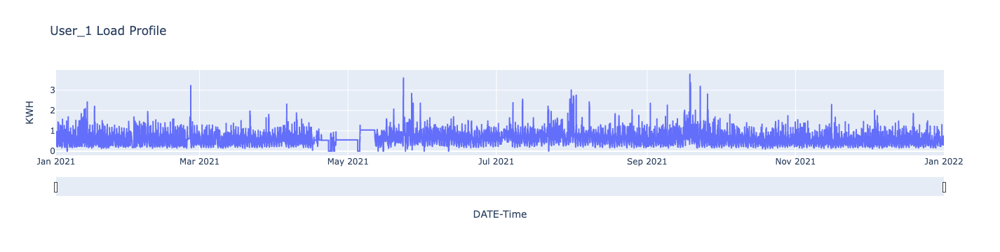

In [4]:
# Examine User_1
fig = px.line(user_1.reset_index(), x='DATE-Time', y='KWH', title='User_1 Load Profile')

fig.update_xaxes(
    rangeslider_visible=True,
)
fig.show()

In [5]:
# Check Missing Value
user_1.isnull().sum()

KWH    0
dtype: int64

In [6]:
user_1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 35040 entries, 2021-01-01 00:00:00 to 2021-12-31 23:45:00
Freq: 15T
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   KWH     35040 non-null  float64
dtypes: float64(1)
memory usage: 547.5 KB


## Perform STL Decomposition

In [7]:
user_1_1H = user_1.reset_index().set_index('DATE-Time').resample("1H").mean()

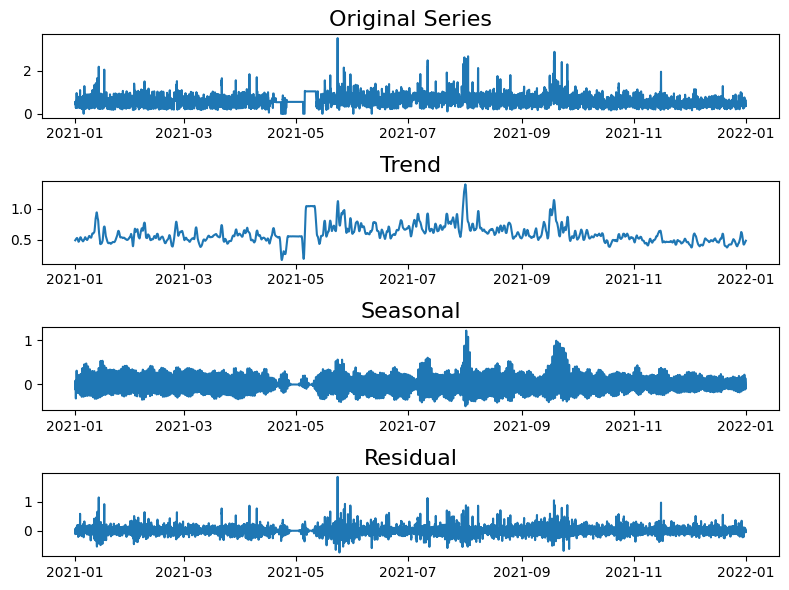

In [8]:
stl = STL(user_1_1H)
result = stl.fit()

seasonal, trend, resid = result.seasonal, result.trend, result.resid

plt.figure(figsize=(8,6))

plt.subplot(4,1,1)
plt.plot(user_1_1H)
plt.title('Original Series', fontsize=16)

plt.subplot(4,1,2)
plt.plot(trend)
plt.title('Trend', fontsize=16)

plt.subplot(4,1,3)
plt.plot(seasonal)
plt.title('Seasonal', fontsize=16)

plt.subplot(4,1,4)
plt.plot(resid)
plt.title('Residual', fontsize=16)

plt.tight_layout()

In [9]:
type(seasonal)

pandas.core.series.Series

In [10]:
seasonal

DATE-Time
2021-01-01 00:00:00    0.027621
2021-01-01 01:00:00    0.084807
2021-01-01 02:00:00   -0.024583
2021-01-01 03:00:00   -0.075367
2021-01-01 04:00:00   -0.079371
                         ...   
2021-12-31 19:00:00   -0.000906
2021-12-31 20:00:00   -0.028529
2021-12-31 21:00:00   -0.047604
2021-12-31 22:00:00   -0.065465
2021-12-31 23:00:00   -0.084284
Freq: H, Name: season, Length: 8760, dtype: float64

In [11]:
type(user_1_1H)

pandas.core.frame.DataFrame

In [12]:
user_1_1H.squeeze()   #use df.squeeze() to convert the DataFrame into a Series

DATE-Time
2021-01-01 00:00:00    0.52400
2021-01-01 01:00:00    0.45825
2021-01-01 02:00:00    0.43250
2021-01-01 03:00:00    0.44625
2021-01-01 04:00:00    0.45500
                        ...   
2021-12-31 19:00:00    0.41700
2021-12-31 20:00:00    0.39275
2021-12-31 21:00:00    0.40200
2021-12-31 22:00:00    0.40000
2021-12-31 23:00:00    0.36000
Freq: H, Name: KWH, Length: 8760, dtype: float64

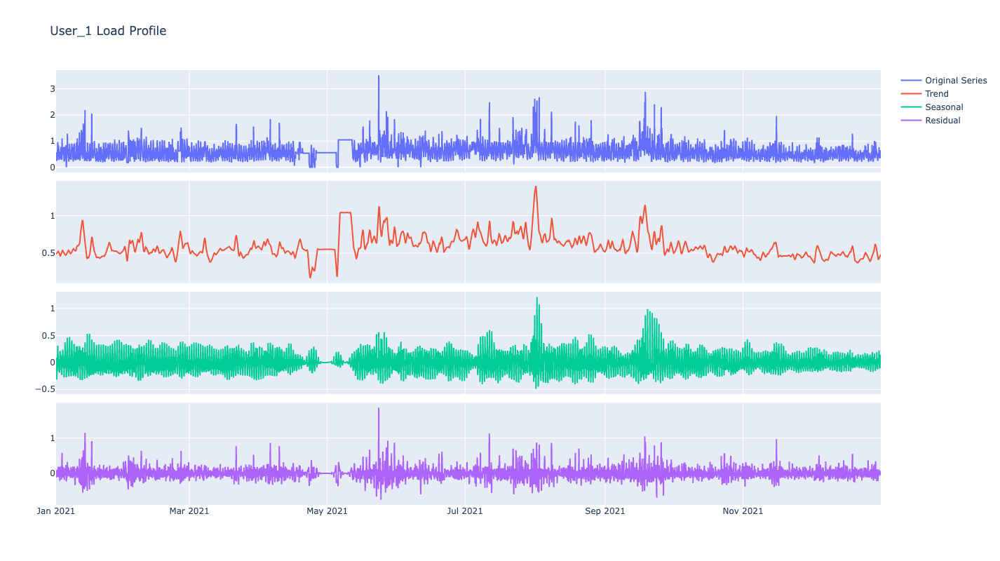

In [13]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

seasonal, trend, resid = result.seasonal, result.trend, result.resid

fig = make_subplots(rows=4, cols=1, shared_xaxes=True, vertical_spacing=0.02)

fig.add_trace(go.Scatter(x=user_1_1H.squeeze().index, y=user_1_1H.squeeze().values, name='Original Series'), row=1, col=1)
fig.add_trace(go.Scatter(x=trend.index, y=trend.values, name='Trend'), row=2, col=1)
fig.add_trace(go.Scatter(x=seasonal.index, y=seasonal.values, name='Seasonal'), row=3, col=1)
fig.add_trace(go.Scatter(x=resid.index, y=resid.values, name='Residual'), row=4, col=1)

# fig.update_xaxes(rangeslider_visible=True)

fig.update_layout(height=800, width=1200, title_text="User_1 Load Profile")

fig.show()


## Feature Engineer

In [14]:
user_1.reset_index(inplace=True)

In [15]:
# Create a quarter column
user_1['quarter'] = (user_1['DATE-Time'].dt.hour * 4) + (user_1['DATE-Time'].dt.minute // 15)

# Create an hour column
user_1['hour'] = user_1['DATE-Time'].dt.hour

# Create a weekday column
user_1['weekday'] = pd.Categorical(user_1["DATE-Time"].dt.strftime('%A'),   # '%A' represents to Weekday as locale’s full name.
                             categories=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday', 'Sunday'],
                             ordered=True)

# Create Day of weekday
user_1['day'] = user_1['DATE-Time'].dt.weekday

# Create a month column
user_1['month'] = user_1['DATE-Time'].dt.month

# Create 'Weekend' vs 'Weekday'
user_1['weekend'] = user_1['weekday'].isin(['Saturday', 'Sunday']).astype(int)

user_1

,DATE-Time,KWH,quarter,hour,weekday,day,month,weekend
0,2021-01-01 00:00:00,0.602,0,0,Friday,4,1,0
1,2021-01-01 00:15:00,0.589,1,0,Friday,4,1,0
2,2021-01-01 00:30:00,0.410,2,0,Friday,4,1,0
3,2021-01-01 00:45:00,0.495,3,0,Friday,4,1,0
4,2021-01-01 01:00:00,0.450,4,1,Friday,4,1,0
...,...,...,...,...,...,...,...,...
35035,2021-12-31 22:45:00,0.405,91,22,Friday,4,12,0
35036,2021-12-31 23:00:00,0.349,92,23,Friday,4,12,0
35037,2021-12-31 23:15:00,0.305,93,23,Friday,4,12,0
35038,2021-12-31 23:30:00,0.398,94,23,Friday,4,12,0


In [16]:
def get_duration_period(time):
    """
    Maps the given time value to one of the four duration periods.
    """
    hour = time.hour
    if 2 <= hour <= 19:
        return "peak"
    elif 5 <= hour < 14:
        return "daytime_semi_peak"
    elif 19 < hour <= 23:
        return "nighttime_semi_peak"
    else:
        return "off_peak"

# Create a new 'duration_period' column
user_1["duration_period"] = user_1["DATE-Time"].apply(get_duration_period)

In [17]:
user_1

,DATE-Time,KWH,quarter,hour,weekday,day,month,weekend,duration_period
0,2021-01-01 00:00:00,0.602,0,0,Friday,4,1,0,off_peak
1,2021-01-01 00:15:00,0.589,1,0,Friday,4,1,0,off_peak
2,2021-01-01 00:30:00,0.410,2,0,Friday,4,1,0,off_peak
3,2021-01-01 00:45:00,0.495,3,0,Friday,4,1,0,off_peak
4,2021-01-01 01:00:00,0.450,4,1,Friday,4,1,0,off_peak
...,...,...,...,...,...,...,...,...,...
35035,2021-12-31 22:45:00,0.405,91,22,Friday,4,12,0,nighttime_semi_peak
35036,2021-12-31 23:00:00,0.349,92,23,Friday,4,12,0,nighttime_semi_peak
35037,2021-12-31 23:15:00,0.305,93,23,Friday,4,12,0,nighttime_semi_peak
35038,2021-12-31 23:30:00,0.398,94,23,Friday,4,12,0,nighttime_semi_peak


In [18]:
# Map each duration period category to a numerical value
duration_period_map = {
    "peak": 1,
    "daytime_semi_peak": 2,
    "nighttime_semi_peak": 3,
    "off_peak": 4
}
user_1["duration_period_num"] = user_1["duration_period"].map(duration_period_map)
user_1

,DATE-Time,KWH,quarter,hour,weekday,day,month,weekend,duration_period,duration_period_num
0,2021-01-01 00:00:00,0.602,0,0,Friday,4,1,0,off_peak,4
1,2021-01-01 00:15:00,0.589,1,0,Friday,4,1,0,off_peak,4
2,2021-01-01 00:30:00,0.410,2,0,Friday,4,1,0,off_peak,4
3,2021-01-01 00:45:00,0.495,3,0,Friday,4,1,0,off_peak,4
4,2021-01-01 01:00:00,0.450,4,1,Friday,4,1,0,off_peak,4
...,...,...,...,...,...,...,...,...,...,...
35035,2021-12-31 22:45:00,0.405,91,22,Friday,4,12,0,nighttime_semi_peak,3
35036,2021-12-31 23:00:00,0.349,92,23,Friday,4,12,0,nighttime_semi_peak,3
35037,2021-12-31 23:15:00,0.305,93,23,Friday,4,12,0,nighttime_semi_peak,3
35038,2021-12-31 23:30:00,0.398,94,23,Friday,4,12,0,nighttime_semi_peak,3


In [19]:
user_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35040 entries, 0 to 35039
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   DATE-Time            35040 non-null  datetime64[ns]
 1   KWH                  35040 non-null  float64       
 2   quarter              35040 non-null  int64         
 3   hour                 35040 non-null  int64         
 4   weekday              35040 non-null  category      
 5   day                  35040 non-null  int64         
 6   month                35040 non-null  int64         
 7   weekend              35040 non-null  int64         
 8   duration_period      35040 non-null  object        
 9   duration_period_num  35040 non-null  int64         
dtypes: category(1), datetime64[ns](1), float64(1), int64(6), object(1)
memory usage: 2.4+ MB


## Train model

In [20]:
# data = user_1[['KWH', 'quarter', 'day', 'month', 'weekend', 'duration_period_num']]
data = user_1[['KWH', 'quarter', 'day']]
data

,KWH,quarter,day
0,0.602,0,4
1,0.589,1,4
2,0.410,2,4
3,0.495,3,4
4,0.450,4,4
...,...,...,...
35035,0.405,91,4
35036,0.349,92,4
35037,0.305,93,4
35038,0.398,94,4


In [21]:
# from sklearn.preprocessing import StandardScaler

# # Create a StandardScaler object
# scaler = StandardScaler()

# # Fit the scaler to your data
# scaler.fit(data)

# # Transform your data using the scaler
# data_scaled = scaler.transform(data)

# # Convert the scaled data back into a DataFrame
# data_scaled = pd.DataFrame(data_scaled, columns=data.columns)

In [22]:
# data_scaled

In [23]:
# from sklearn.ensemble import IsolationForest
# from sklearn.model_selection import GridSearchCV

# # Define the hyperparameters and their ranges for the grid search
# hyperparameters = {
#     "n_estimators": [50, 100, 150],
#     "max_samples": ["auto", 0.5, 0.7],
#     "contamination": [0.05, 0.1, 0.15]
# }

# # Create an IsolationForest object
# isolation_forest = IsolationForest(random_state=42)

# # Create a GridSearchCV object with the isolation forest model and the hyperparameters to search
# grid_search = GridSearchCV(isolation_forest, hyperparameters, cv=5, scoring='roc_auc', n_jobs=-1)

# # Measure the time taken to train the model
# start_time = time.time()

# # Fit the grid search object to your scaled data
# # grid_search.fit(data_scaled)

# # Fit the grid search object to your scaled data with tqdm progress bar
# for _ in tqdm(range(5)):
#     grid_search.fit(data_scaled)

# # Print the training time
# print("Time taken to train the model: {:.2f} seconds".format(time.time() - start_time))

# # Print the best hyperparameters and the corresponding ROC AUC score
# print("Best hyperparameters: ", grid_search.best_params_)
# print("Best ROC AUC score: ", grid_search.best_score_)

# # Use the best hyperparameters to train an Isolation Forest model
# best_n_estimators = grid_search.best_params_['n_estimators']
# best_max_samples = grid_search.best_params_['max_samples']
# best_contamination = grid_search.best_params_['contamination']
# model = IsolationForest(n_estimators=best_n_estimators, max_samples=best_max_samples, contamination=best_contamination, random_state=42, n_jobs=-1)
# model.fit(data_scaled)

# # Predict the anomaly score for each data point
# anomaly_scores = model.decision_function(data_scaled)

# # Convert the anomaly scores to a DataFrame
# anomaly_scores = pd.DataFrame(anomaly_scores, columns=["anomaly_score"])

# # Add the anomaly scores back to your original DataFrame
# data_with_anomalies = pd.concat([data, anomaly_scores], axis=1)

# # Identify the anomalies in your data (i.e. data points with a score below the threshold)
# threshold = data_with_anomalies["anomaly_score"].quantile(0.1)
# anomalies = data_with_anomalies[data_with_anomalies["anomaly_score"] < threshold]


In [24]:
# Create an IsolationForest object
model =  IsolationForest(contamination=0.01, max_features=3, max_samples='auto', n_estimators=100, random_state=42, n_jobs=-1)

# Measure the time taken to train the model
start_time = time.time()

# Train an Isolation Forest model
model.fit(data)

# Print the training time
print("Time taken to train the model: {:.2f} seconds".format(time.time() - start_time))

# Predict the anomaly score for each data point
anomaly_scores = model.decision_function(data)

# Convert the anomaly scores to a DataFrame
anomaly_scores = pd.DataFrame(anomaly_scores, columns=["anomaly_score"])

# Add the anomaly scores back to your original DataFrame
data_with_anomalies = pd.concat([data, anomaly_scores], axis=1)

# Identify the anomalies in your data (i.e. data points with a score below the threshold)
threshold = data_with_anomalies["anomaly_score"].quantile(0.1)
anomalies = data_with_anomalies[data_with_anomalies["anomaly_score"] < threshold]

Time taken to train the model: 0.77 seconds


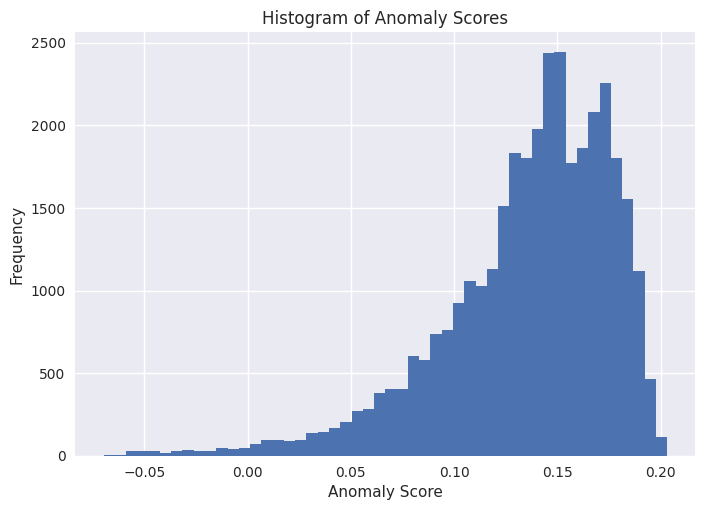

In [25]:
import matplotlib.pyplot as plt

# Set the style of the plot
plt.style.use("seaborn")

# Create a histogram of the anomaly scores
plt.hist(anomaly_scores["anomaly_score"], bins=50)

# Add labels and title to the plot
plt.xlabel("Anomaly Score")
plt.ylabel("Frequency")
plt.title("Histogram of Anomaly Scores")
plt.show()

In [26]:
# Before setting threshold
user_1['outliers']=pd.Series(model.predict(data)).apply(lambda x: 'yes' if (x == -1) else 'no' )
print("The anomaly events: ", len(user_1.query('outliers=="yes"')))
user_1.query('outliers=="yes"')

The anomaly events:  351


,DATE-Time,KWH,quarter,hour,weekday,day,month,weekend,duration_period,duration_period_num,outliers
252,2021-01-03 15:00:00,1.571,60,15,Sunday,6,1,1,peak,1,yes
478,2021-01-05 23:30:00,1.687,94,23,Tuesday,1,1,0,nighttime_semi_peak,3,yes
777,2021-01-09 02:15:00,1.511,9,2,Saturday,5,1,1,peak,1,yes
864,2021-01-10 00:00:00,1.186,0,0,Sunday,6,1,1,off_peak,4,yes
959,2021-01-10 23:45:00,1.502,95,23,Sunday,6,1,1,nighttime_semi_peak,3,yes
...,...,...,...,...,...,...,...,...,...,...,...
33125,2021-12-12 01:15:00,1.376,5,1,Sunday,6,12,1,off_peak,4,yes
33252,2021-12-13 09:00:00,1.475,36,9,Monday,0,12,0,peak,1,yes
33830,2021-12-19 09:30:00,1.853,38,9,Sunday,6,12,1,peak,1,yes
33836,2021-12-19 11:00:00,1.791,44,11,Sunday,6,12,1,peak,1,yes


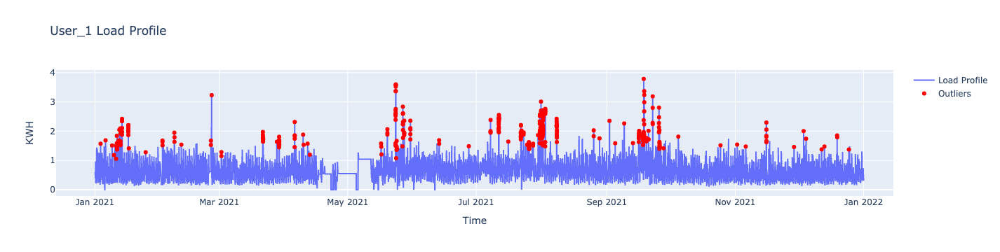

In [27]:
# Create a line plot for the load profile
fig = go.Figure()
fig.add_trace(go.Scatter(x=user_1['DATE-Time'], y=user_1['KWH'], mode='lines', name='Load Profile'))

# Mark the outliers in red
outlier_data = user_1[user_1['outliers'] == 'yes']
fig.add_trace(go.Scatter(x=outlier_data['DATE-Time'], y=outlier_data['KWH'], mode='markers', marker=dict(color='red'), name='Outliers'))

# Set the plot title and axis labels
fig.update_layout(title='User_1 Load Profile', xaxis_title='Time', yaxis_title='KWH')

fig.update_xaxes(
    rangeslider_visible=False,
)

# Display the plot
fig.show()

In [28]:
# Add the anomaly scores back to your original DataFrame
user_1_with_anomalies = pd.concat([user_1, anomaly_scores], axis=1)
user_1_with_anomalies

,DATE-Time,KWH,quarter,hour,weekday,day,month,weekend,duration_period,duration_period_num,outliers,anomaly_score
0,2021-01-01 00:00:00,0.602,0,0,Friday,4,1,0,off_peak,4,no,0.114145
1,2021-01-01 00:15:00,0.589,1,0,Friday,4,1,0,off_peak,4,no,0.129978
2,2021-01-01 00:30:00,0.410,2,0,Friday,4,1,0,off_peak,4,no,0.102262
3,2021-01-01 00:45:00,0.495,3,0,Friday,4,1,0,off_peak,4,no,0.130038
4,2021-01-01 01:00:00,0.450,4,1,Friday,4,1,0,off_peak,4,no,0.123566
...,...,...,...,...,...,...,...,...,...,...,...,...
35035,2021-12-31 22:45:00,0.405,91,22,Friday,4,12,0,nighttime_semi_peak,3,no,0.103498
35036,2021-12-31 23:00:00,0.349,92,23,Friday,4,12,0,nighttime_semi_peak,3,no,0.092973
35037,2021-12-31 23:15:00,0.305,93,23,Friday,4,12,0,nighttime_semi_peak,3,no,0.084921
35038,2021-12-31 23:30:00,0.398,94,23,Friday,4,12,0,nighttime_semi_peak,3,no,0.081394


In [29]:
print("The anomaly events: ", len(user_1_with_anomalies.query('anomaly_score<-0.02')))
user_1_with_anomalies.query('anomaly_score<-0.02')

The anomaly events:  207


,DATE-Time,KWH,quarter,hour,weekday,day,month,weekend,duration_period,duration_period_num,outliers,anomaly_score
959,2021-01-10 23:45:00,1.502,95,23,Sunday,6,1,1,nighttime_semi_peak,3,yes,-0.036657
994,2021-01-11 08:30:00,1.840,34,8,Monday,0,1,0,peak,1,yes,-0.031665
1053,2021-01-11 23:15:00,1.632,93,23,Monday,0,1,0,nighttime_semi_peak,3,yes,-0.032411
1155,2021-01-13 00:45:00,2.093,3,0,Wednesday,2,1,0,off_peak,4,yes,-0.043827
1156,2021-01-13 01:00:00,1.925,4,1,Wednesday,2,1,0,off_peak,4,yes,-0.033143
...,...,...,...,...,...,...,...,...,...,...,...,...
30603,2021-11-15 18:45:00,1.808,75,18,Monday,0,11,0,peak,1,yes,-0.025646
30604,2021-11-15 19:00:00,1.839,76,19,Monday,0,11,0,peak,1,yes,-0.028948
30606,2021-11-15 19:30:00,2.294,78,19,Monday,0,11,0,peak,1,yes,-0.057817
30607,2021-11-15 19:45:00,2.052,79,19,Monday,0,11,0,peak,1,yes,-0.044148


In [30]:
user_1_with_anomalies['outliers_new'] = pd.Series(user_1_with_anomalies['anomaly_score'] <= -0.02).apply(lambda x: 'yes' if (x == True) else 'no' )

print("The anomaly events: ", len(user_1_with_anomalies.query('outliers_new == "yes"')))
user_1_with_anomalies.query('outliers_new == "yes"')

The anomaly events:  207


,DATE-Time,KWH,quarter,hour,weekday,day,month,weekend,duration_period,duration_period_num,outliers,anomaly_score,outliers_new
959,2021-01-10 23:45:00,1.502,95,23,Sunday,6,1,1,nighttime_semi_peak,3,yes,-0.036657,yes
994,2021-01-11 08:30:00,1.840,34,8,Monday,0,1,0,peak,1,yes,-0.031665,yes
1053,2021-01-11 23:15:00,1.632,93,23,Monday,0,1,0,nighttime_semi_peak,3,yes,-0.032411,yes
1155,2021-01-13 00:45:00,2.093,3,0,Wednesday,2,1,0,off_peak,4,yes,-0.043827,yes
1156,2021-01-13 01:00:00,1.925,4,1,Wednesday,2,1,0,off_peak,4,yes,-0.033143,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...
30603,2021-11-15 18:45:00,1.808,75,18,Monday,0,11,0,peak,1,yes,-0.025646,yes
30604,2021-11-15 19:00:00,1.839,76,19,Monday,0,11,0,peak,1,yes,-0.028948,yes
30606,2021-11-15 19:30:00,2.294,78,19,Monday,0,11,0,peak,1,yes,-0.057817,yes
30607,2021-11-15 19:45:00,2.052,79,19,Monday,0,11,0,peak,1,yes,-0.044148,yes


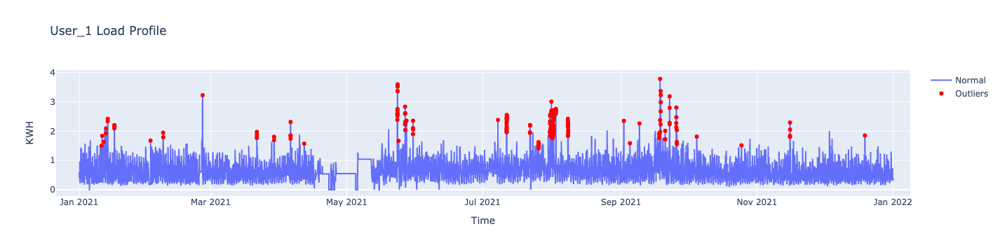

In [31]:
# Create a line plot for the load profile
fig = go.Figure()
fig.add_trace(go.Scatter(x=user_1_with_anomalies['DATE-Time'], y=user_1_with_anomalies['KWH'], mode='lines', name='Normal'))

# Mark the outliers in red
outlier_data = user_1_with_anomalies[user_1_with_anomalies['outliers_new'] == 'yes']
fig.add_trace(go.Scatter(x=outlier_data['DATE-Time'], y=outlier_data['KWH'], mode='markers', marker=dict(color='red'), name='Outliers'))

# Set the plot title and axis labels
fig.update_layout(title='User_1 Load Profile', xaxis_title='Time', yaxis_title='KWH')

fig.update_xaxes(
    rangeslider_visible=False,
)

# Display the plot
fig.show()

## Evaluation Model

In [32]:
anomaly_scores

,anomaly_score
0,0.114145
1,0.129978
2,0.102262
3,0.130038
4,0.123566
...,...
35035,0.103498
35036,0.092973
35037,0.084921
35038,0.081394


In [33]:
user_1_with_anomalies['anomaly_score'].to_frame()

,anomaly_score
0,0.114145
1,0.129978
2,0.102262
3,0.130038
4,0.123566
...,...
35035,0.103498
35036,0.092973
35037,0.084921
35038,0.081394


In [34]:
from sklearn.metrics import roc_auc_score

# Calculate the AUC-ROC score
auc_roc = roc_auc_score(-anomaly_scores, np.ones(len(anomaly_scores)))

# Print the AUC-ROC score
print("AUC-ROC score:", auc_roc)

ValueError: continuous format is not supported